In [ ]:
#!pip uninstall torch torchvision -y

In [ ]:
#!pip install torch torchvision --index-url https://download.pytorch.org/whl/cu118

In [1]:
!pip install bertopic datasets accelerate bitsandbytes xformers adjustText

# **Data**

In [2]:
from datasets import load_dataset

dataset = load_dataset("CShorten/ML-ArXiv-Papers")["train"]

abstracts = dataset["abstract"]
titles = dataset["title"]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [3]:
print("Title:", titles[11965])
print("Abstract:", abstracts[11965])

Title: Modelling Competitive Sports: Bradley-Terry-\'{E}l\H{o} Models for
  Supervised and On-Line Learning of Paired Competition Outcomes
Abstract:   Prediction and modelling of competitive sports outcomes has received much
recent attention, especially from the Bayesian statistics and machine learning
communities. In the real world setting of outcome prediction, the seminal
\'{E}l\H{o} update still remains, after more than 50 years, a valuable baseline
which is difficult to improve upon, though in its original form it is a
heuristic and not a proper statistical "model". Mathematically, the \'{E}l\H{o}
rating system is very closely related to the Bradley-Terry models, which are
usually used in an explanatory fashion rather than in a predictive supervised
or on-line learning setting.
  Exploiting this close link between these two model classes and some newly
observed similarities, we propose a new supervised learning framework with
close similarities to logistic regression, low-rank mat

In [4]:
len(abstracts)

117592

In [6]:
from huggingface_hub import notebook_login
notebook_login()

In [7]:
from torch import cuda

model_id = 'meta-llama/Llama-2-7b-chat-hf'
device = f'cuda:{cuda.current_device()}' if cuda.is_available() else 'cpu'

print(device)

cuda:0


In [8]:
from torch import bfloat16
import transformers

# set quantization configuration to load large model with less GPU memory
# this requires the `bitsandbytes` library

bnb_config = transformers.BitsAndBytesConfig(
    load_in_4bit=True,  # 4-bit quantization
    bnb_4bit_quant_type='nf4',  # Normalized float 4
    bnb_4bit_use_double_quant=True,  # Second quantization after the first
    bnb_4bit_compute_dtype=bfloat16  # Computation type
)

In [9]:
# Llama 2 Tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained(model_id)

# Llama 2 Model
model = transformers.AutoModelForCausalLM.from_pretrained(
    model_id,
    trust_remote_code=False,
    quantization_config=bnb_config,
    device_map='auto',
)
model.eval()

tokenizer_config.json:   0%|          | 0.00/1.62k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.84M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/614 [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/26.8k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/9.98G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/3.50G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/188 [00:00<?, ?B/s]

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 4096)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (v_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (o_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear4bit(in_features=4096, out_features=11008, bias=False)
          (up_proj): Linear4bit(in_features=4096, out_features=11008, bias=False)
          (down_proj): Linear4bit(in_features=11008, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((4096,), eps=1e-05)
      )
    )
    (norm): LlamaRMSNorm((4096

In [10]:
# Our text generator
generator = transformers.pipeline(
    model=model, tokenizer=tokenizer,
    task='text-generation',
    temperature=0.1,
    max_new_tokens=500,
    repetition_penalty=1.1
)

Device set to use cuda:0


In [12]:
prompt = "Could you explain to me how 4-bit quantization works as if I am 5?"
res = generator(prompt)
print(res[0]["generated_text"])

Could you explain to me how 4-bit quantization works as if I am 5?
 everybody knows that 4 is a small number, right? so when we take a big number and divide it by 4, we get a smaller number. like if i have 10 cookies and i want to share them equally among 4 of my friends, each friend gets 2.5 cookies. but what happens when we take a really big number like 64 and divide it by 4? well, the answer is still a big number! 64 divided by 4 is 16. see? it's not changing the size of the number much at all.

so, in computer science, we use something called "quantization" to make really big numbers smaller. instead of dividing by 4, we divide by 8 or 16 or even 32. this makes the number smaller, but it doesn't change the value of the number too much. it's like taking a big cookie and cutting it into smaller pieces. the cookie might be bigger than any one piece, but now there are more pieces to eat!

quantization is important because computers can only store numbers in a certain number of bits (li

In [11]:
prompt = "is quantization same as clustering? explain as if I am 5"
res = generator(prompt)
print(res[0]["generated_text"])

is quantization same as clustering? explain as if I am 5 years old. everybody knows what a cluster is, but may not know the term "quantization".

Quantization is like grouping toys together! Imagine you have a big box full of different colored balls. Each color represents a special thing, like a type of fruit or a type of animal. But instead of just having one ball of each color, you want to group them together so they're easier to find and play with. So you take all the red balls and put them in one basket, all the blue balls in another, and so on. That's kind of like quantization!

Now imagine that some of the balls are really similar, but not exactly the same. Maybe some of them are slightly bigger or smaller, or maybe they have a tiny bit of a different color. Instead of putting all those similar balls into the same basket, you might want to create smaller groups within each category. For example, you could have a group of small red balls, a group of medium-sized blue balls, and a 

**## Prompt Template**

In [13]:
"""
<s>[INST] <<SYS>>

{{ System Prompt }}

<</SYS>>

{{ User Prompt }} [/INST]

{{ Model Answer }}
"""

'\n<s>[INST] <<SYS>>\n\n{{ System Prompt }}\n\n<</SYS>>\n\n{{ User Prompt }} [/INST]\n\n{{ Model Answer }}\n'

In [14]:
# Describes information given to all conversations
system_prompt = """
<s>[INST] <<SYS>>
You are a helpful, respectful and honest assistant for labeling topics.
<</SYS>>
"""

In [15]:
# Example prompt demonstrating the expected output
example_prompt = """
I have a topic that contains the following documents:
- Traditional diets in most cultures were primarily plant-based with a little meat on top, but with the rise of industrial style meat production and factory farming, meat has become a staple food.
- Meat, but especially beef, is the word food in terms of emissions.
- Eating meat doesn't make you a bad person, not eating meat doesn't make you a good one.

The topic is described by the following keywords: 'meat, beef, eat, eating, emissions, steak, food, health, processed, chicken'.

Based on the information about the topic above, please create a short label of this topic. Make sure you only return the label and nothing more.

[/INST] Environmental impacts of eating meat
"""

In [16]:
# The main prompt with documents ([DOCUMENTS]) and keywords ([KEYWORDS]) tags
main_prompt = """
[INST]
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the information about the topic above, please create a short label of this topic. Make sure you to only return the label and nothing more.
[/INST]
"""

In [17]:
prompt = system_prompt + example_prompt + main_prompt

## **BertTopic**

Two important steps:

*   Pre-calculating Embeddings
*   Defining Sub-models

### **Embeddings**

In [18]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("BAAI/bge-small-en")
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/90.8k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/684 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/366 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling%2Fconfig.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/3675 [00:00<?, ?it/s]

### **Sub-models**

In [20]:
from umap import UMAP
from hdbscan import HDBSCAN

umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

In [21]:
# Pre-reduce embeddings for visualization purposes
reduced_embeddings = UMAP(n_neighbors=15, n_components=2, min_dist=0.0, metric='cosine', random_state=42).fit_transform(embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### **Multiple Representation Models**

In [22]:
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, TextGeneration

# KeyBERT
keybert = KeyBERTInspired()

# MMR
mmr = MaximalMarginalRelevance(diversity=0.3)

# Text generation with Llama 2
llama2 = TextGeneration(generator, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert,
    "Llama2": llama2,
    "MMR": mmr,
}

## **Trainig**

In [23]:
from bertopic import BERTopic

topic_model = BERTopic(

  # Sub-models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(abstracts, embeddings)

2025-02-21 23:08:24,210 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-02-21 23:11:10,243 - BERTopic - Dimensionality - Completed ✓
2025-02-21 23:11:10,247 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-02-21 23:11:32,309 - BERTopic - Cluster - Completed ✓
2025-02-21 23:11:32,355 - BERTopic - Representation - Extracting topics from clusters using representation models.
100%|██████████| 128/128 [20:14<00:00,  9.48s/it]
2025-02-21 23:32:20,471 - BERTopic - Representation - Completed ✓


In [24]:
# Show topics
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,Llama2,MMR,Representative_Docs
0,-1,33711,-1_the_of_and_to,"[the, of, and, to, in, we, for, is, that, on]","[datasets, prediction, networks, models, model...","[Deep Learning Research, , , , , , , , , ]","[of, we, for, data, learning, model, models, f...",[ Subspace clustering has established itself ...
1,0,10367,0_policy_reinforcement_rl_agent,"[policy, reinforcement, rl, agent, learning, c...","[reinforcement, learning, dynamics, robots, le...","[Reinforcement Learning and Control, , , , , ,...","[policy, reinforcement, rl, learning, control,...",[ Deep reinforcement learning agents have rec...
2,1,3506,1_speech_audio_speaker_music,"[speech, audio, speaker, music, asr, acoustic,...","[voice, encoder, speech, language, trained, mo...","[Audio-Visual Speech Processing, , , , , , , ,...","[audio, asr, acoustic, recognition, voice, wit...",[ Speaker recognition is a well known and stu...
3,2,2407,2_networks_neural_relu_activation,"[networks, neural, relu, activation, layer, ne...","[dnns, regularization, gradient, networks, lay...","[Deep Learning Theory, , , , , , , , , ]","[networks, neural, relu, activation, training,...",[ We propose and analyze a new family of algo...
4,3,2364,3_equations_differential_physics_neural,"[equations, differential, physics, neural, dyn...","[pdes, pde, modeling, dynamics, models, equati...","[Numerical Solutions of Nonlinear PDEs, , , , ...","[equations, physics, dynamics, pdes, dynamical...",[ We present a novel deep learning approach t...
...,...,...,...,...,...,...,...,...
123,122,161,122_summarization_summaries_summary_abstractive,"[summarization, summaries, summary, abstractiv...","[summarization, summarisation, summarizing, su...","[Summarization Techniques, , , , , , , , , ]","[summarization, summaries, summary, rouge, ext...",[ Abstractive Text Summarization is the proce...
124,123,160,123_crowdsourcing_workers_crowd_worker,"[crowdsourcing, workers, crowd, worker, crowds...","[crowdsourcing, crowdsourced, annotators, crow...","[Crowdsourcing Label Quality, , , , , , , , , ]","[crowdsourcing, worker, crowdsourced, labels, ...",[ There is a rapidly increasing interest in c...
125,124,160,124_view_views_multi_clustering,"[view, views, multi, clustering, subspace, mul...","[multiview, clustering, datasets, subspace, re...","[Multi-View Clustering, , , , , , , , , ]","[views, clustering, subspace, data, matrix, le...",[ With recent advances in data collection fro...
126,125,154,125_augmentation_mixup_data_augmentations,"[augmentation, mixup, data, augmentations, tra...","[adversarial, augmentation, imagenet, regulari...","[Augmentation for Improved Generalization, , ,...","[augmentation, mixup, augmentations, training,...",[ Data augmentation techniques have become st...


In [25]:
topic_model.get_topic(1, full=True)["KeyBERT"]

[('voice', 0.8557289),
 ('encoder', 0.853503),
 ('speech', 0.8482003),
 ('language', 0.8465371),
 ('trained', 0.83973646),
 ('models', 0.838158),
 ('audio', 0.837103),
 ('neural', 0.8370913),
 ('model', 0.83583546),
 ('supervised', 0.8346931)]

In [26]:
llama2_labels = [label[0][0].split("\n")[0] for label in topic_model.get_topics(full=True)["Llama2"].values()]
topic_model.set_topic_labels(llama2_labels)

## **Visualization**

In [27]:
topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, hide_annotations=True, hide_document_hover=False, custom_labels=True)

## **Advanced Visualization**

In [28]:
import itertools
import pandas as pd

# Define colors for the visualization to iterate over
colors = itertools.cycle(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
color_key = {str(topic): next(colors) for topic in set(topic_model.topics_) if topic != -1}

# Prepare dataframe and ignore outliers
df = pd.DataFrame({"x": reduced_embeddings[:, 0], "y": reduced_embeddings[:, 1], "Topic": [str(t) for t in topic_model.topics_]})
df["Length"] = [len(doc) for doc in abstracts]
df = df.loc[df.Topic != "-1"]
df = df.loc[(df.y > -10) & (df.y < 10) & (df.x < 10) & (df.x > -10), :]
df["Topic"] = df["Topic"].astype("category")

# Get centroids of clusters
mean_df = df.groupby("Topic").mean().reset_index()
mean_df.Topic = mean_df.Topic.astype(int)
mean_df = mean_df.sort_values("Topic")

ValueError: 1         #911eb4
2         #fffac8
4         #f032e6
8         #e6beff
9         #aaffc3
           ...   
117583    #008080
117584    #fabebe
117585    #e6194b
117588    #e6194b
117591    #f58231
Name: Topic, Length: 53491, dtype: object is not a valid value for color: supported inputs are (r, g, b) and (r, g, b, a) 0-1 float tuples; '#rrggbb', '#rrggbbaa', '#rgb', '#rgba' strings; named color strings; string reprs of 0-1 floats for grayscale values; 'C0', 'C1', ... strings for colors of the color cycle; and pairs combining one of the above with an alpha value

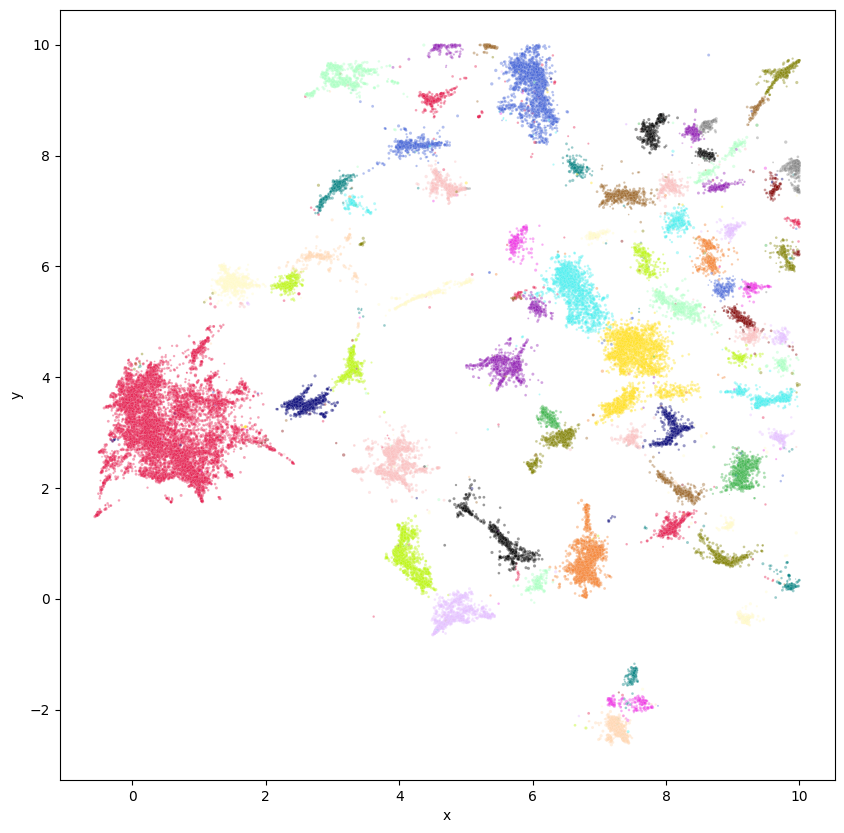

In [29]:
import seaborn as sns
from matplotlib import pyplot as plt
from adjustText import adjust_text
import matplotlib.patheffects as pe
import textwrap

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(data=df, x='x', y='y', c=df['Topic'].map(color_key), alpha=0.4, sizes=(0.4, 10), size="Length")

# Annotate top 50 topics
texts, xs, ys = [], [], []
for row in mean_df.iterrows():
  topic = row[1]["Topic"]
  name = textwrap.fill(topic_model.custom_labels_[int(topic)], 20)

  if int(topic) <= 50:
    xs.append(row[1]["x"])
    ys.append(row[1]["y"])
    texts.append(plt.text(row[1]["x"], row[1]["y"], name, size=10, ha="center", color=color_key[str(int(topic))],
                          path_effects=[pe.withStroke(linewidth=0.5, foreground="black")]
                          ))

# Adjust annotations such that they do not overlap
adjust_text(texts, x=xs, y=ys, time_lim=1, force_text=(0.01, 0.02), force_static=(0.01, 0.02), force_pull=(0.5, 0.5))
plt.axis('off')
plt.legend('', frameon=False)
plt.show()

In [30]:
# To save: model, reduced embeddings, representative docs
!pip install safetensors

In [31]:
import pickle

with open('rep_docs.pickle', 'wb') as handle:
    pickle.dump(topic_model.representative_docs_, handle, protocol=pickle.HIGHEST_PROTOCOL)

with open('reduced_embeddings.pickle', 'wb') as handle:
    pickle.dump(reduced_embeddings, handle, protocol=pickle.HIGHEST_PROTOCOL)

# with open('filename.pickle', 'rb') as handle:
#     b = pickle.load(handle)

In [32]:
embedding_model = "BAAI/bge-small-en"
topic_model.save("final", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

In [33]:
!zip -r /content/llama2.zip /content/final

  adding: content/final/ (stored 0%)
  adding: content/final/topic_embeddings.safetensors (deflated 7%)
  adding: content/final/ctfidf.safetensors (deflated 47%)
  adding: content/final/ctfidf_config.json (deflated 65%)
  adding: content/final/config.json (deflated 42%)
  adding: content/final/topics.json (deflated 84%)


In [34]:
!jupyter nbconvert --to markdown Topic_Modeling_with_Llama2.ipynb

[NbConvertApp] WARNING | pattern 'Topic_Modeling_with_Llama2.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True